<br>

<center>
    <span style="font-size:24px; font-weight:bold;">Malaysia Road Obstacle Detection - Custom Dataset + YOLOv8</span>
</center>

<br>

<hr style="border: none; border-top: 1px solid #000;">

<center>
    <span>
        Created by <b>Ian Yap</b>
        &emsp;|&emsp;
        Data from <b>Google Images</b>
        <!-- Data from <a href="https://www.kaggle.com/datasets/tolgadincer/labeled-chest-xray-images?resource=download"><b>Kaggle</b></a> -->
        &nbsp;
    </span>
</center>

<br>

<center>
    <span>
        <a href="https://www.linkedin.com/in/ian-yap-052870139/"><b>LinkedIn</b></a>
        &emsp;|&emsp;
        <a href="https://xiyap.github.io/"><b>Portfolio</b></a>
    </span>
</center>
    
<hr style="border: none; border-top: 1px solid #000;">


<span style="font-size:24px; font-weight:bold; text-decoration:underline;">Aim</span>

To develop a robust road obstacle detection system capable of accurately detecting and categorizing obstacles on Malaysian roads.

<span style="font-size:24px; font-weight:bold; text-decoration:underline;">Problem Statement</span>

A YOLO object detection model could be used as the foundation for this application as this deep learning model has been trained on the extensive COCO dataset, comprising over 118,000 annotated images with 80 different object categories.

Despite the dataset containing 80 classes, it doesn't encompass all obstacles on the road. Additionally, the dataset may have been trained on images featuring objects from different countries, which could hinder its ability to generalize effectively to our specific application.

<span style="font-size:24px; font-weight:bold; text-decoration:underline;">Objective</span>

The objective of this project is to train a YOLO model using a custom dataset featuring images of road obstacles in Malaysia to ensure that the object detection model adapts seamlessly to our country's unique conditions with high accuracy.

<span style="font-size:24px; font-weight:bold; text-decoration:underline;">Install Dependencies and Setup</span>

In [1]:
# !pip list

In [2]:
import os
import cv2
import random
import shutil
import numpy as np
# import tensorflow as tf
import matplotlib.pyplot as plt
import glob
from IPython.display import display, Image
import warnings
warnings.filterwarnings('ignore')

In [3]:
seed = 101
random.seed(seed)
np.random.seed(seed)
# tf.random.set_seed(seed)

In [4]:
# Avoid OOM errors by setting GPU Memory Consumption Growth
# gpus = tf.config.experimental.list_physical_devices('GPU')
# for gpu in gpus: 
#     tf.config.experimental.set_memory_growth(gpu, True)

# tf.config.list_physical_devices('GPU')

In [5]:
import torch
torch.cuda.is_available()

True

## Gather Data

Utilize simple_image_download to download Google images in batches using relevant search terms:
- **cones on malaysia road**
- **malaysia car road**
- **malaysia motorcycle road**
- **malaysia pedestrian road**

In [ ]:
import simple_image_download as simp

response = simp.simple_image_download

keywords = ['cones on malaysia road', 'malaysia car road', 'malaysia motorcycle road', 'malaysia pedestrian road']

for kw in keywords:
    response().download(kw, 100)

Sample Data:


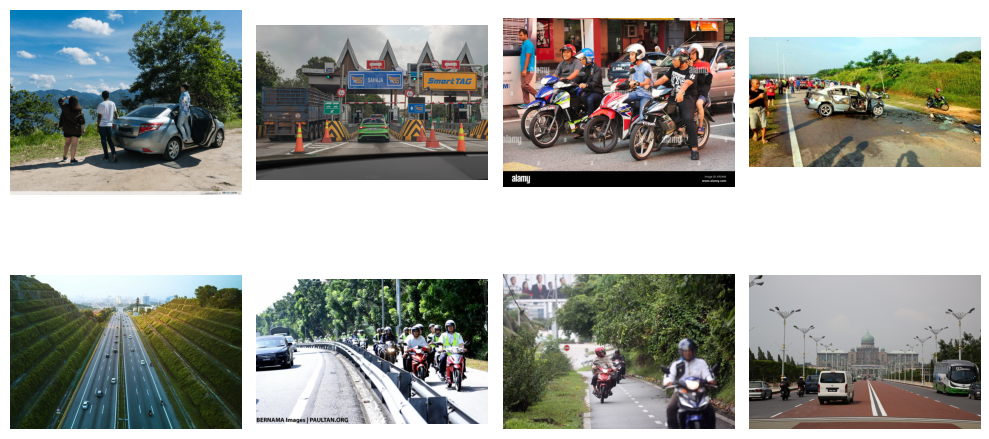

In [7]:
print('Sample Data:')

plt.figure(figsize = (10, 6))

for i in range(0, 8):
    plt.subplot(2, 4, i + 1)
    random_image_file = random.choice(os.listdir('data/train/images'))
    random_image_path = os.path.join('data/train/images', random_image_file)
    img = cv2.imread(random_image_path)
#     img = cv2.resize(img, (400, 400))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.tight_layout()
plt.show();

## Remove Unsupported Images

Remove images with unsupported formats:

labelImg supported formats:
- **.jpeg**
- **.jpg**
- **.png**

In [8]:
from pathlib import Path

In [ ]:
# Image directory
data_dir = Path('data/train/images')

# labelImg formats
image_exts = ['.jpeg', '.jpg', '.png']

for image_file in data_dir.iterdir():
    if image_file.suffix.lower() not in image_exts:
        print(f'{image_file} (Removed due to incompatible format)')
        image_file.unlink()
    else:
        try:
            img = cv2.imread(str(image_file))
            if img is None:
                print(f'{image_file} (Invalid image format)')
                image_file.unlink()
        except Exception as e:
            print(f'{image_file}: {e} (Issue with image)')
            image_file.unlink()

## Label Images

Annotate images using labelImg with classes:
- **cone** (traffic cones)
- **vehicle_4w** (all four wheeled vehicles)
- **motorcycle** (motorcycle w/ rider)
- **pedestrian** (passerby on foot)

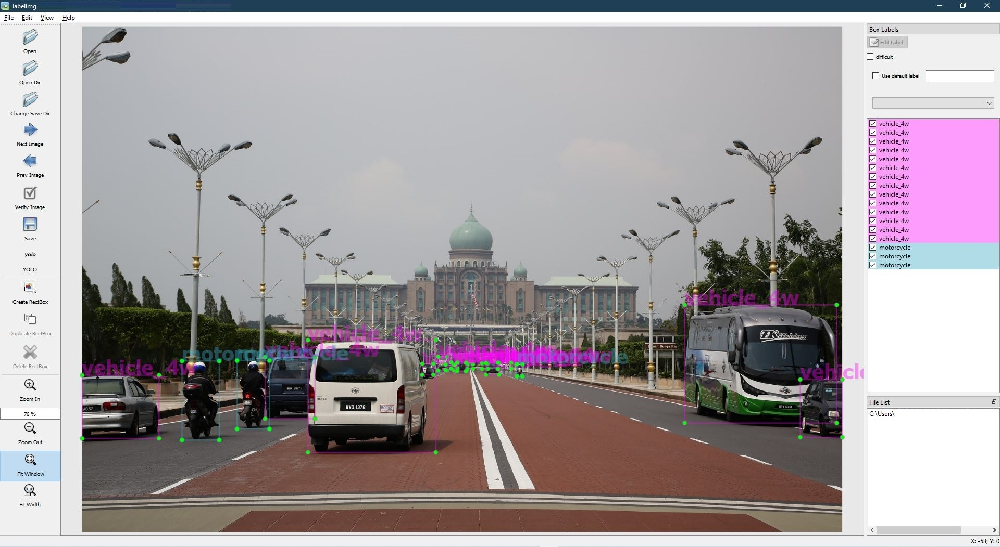

In [10]:
Image('Data-notebook/labelImg1.jpg')

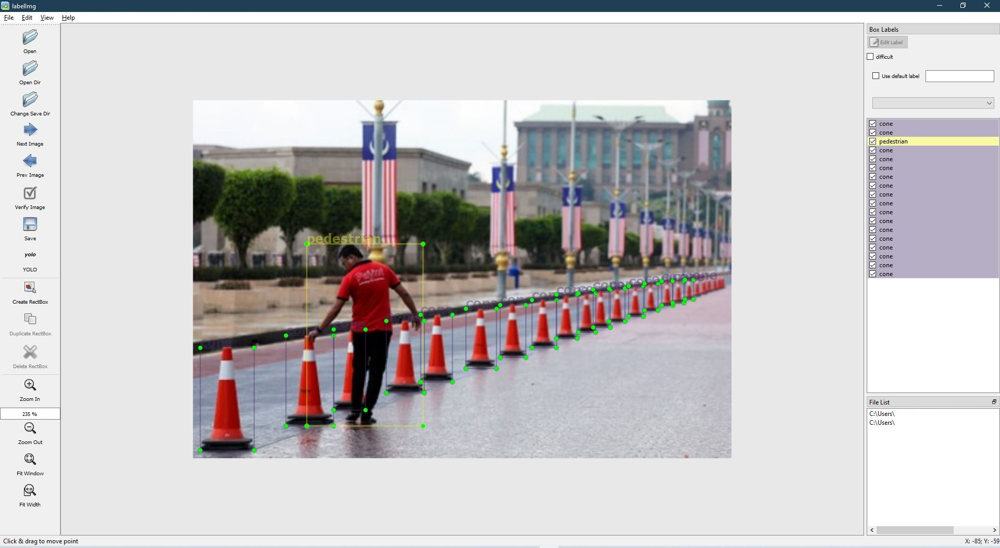

In [11]:
Image('Data-notebook/labelImg2.jpg')

## Split Train/Val

Split dataset into trainining and validation sets. As our dataset is small (<1000), we will assign a larger percentage for training:
- **Train (90%)**
- **Validation (10%)**

In [ ]:
# Image folder path
data_folder = 'data'

# Split percentage
split_percentage = 0.1

def split_data(source_folder, destination_folder, split_percentage):
    # Create destination subfolders if they don't exist
    val_images_folder = os.path.join(destination_folder, 'images')
    val_labels_folder = os.path.join(destination_folder, 'labels')
    
    os.makedirs(val_images_folder, exist_ok = True)
    os.makedirs(val_labels_folder, exist_ok = True)

    # Get list of image files in the source folder
    image_files = [f for f in os.listdir(os.path.join(source_folder, 'images')) if f.lower().endswith(('.jpeg', '.jpg', '.png'))]

    # Calculate the number of images to move
    num_images_to_move = int(len(image_files) * split_percentage)

    # Randomly select images to move
    images_to_move = random.sample(image_files, num_images_to_move)

    # Move selected images and corresponding labels to the destination folder
    for image_file in images_to_move:
        # Construct the label file name based on the image file name
        label_file = os.path.splitext(image_file)[0] + '.txt'
        
        image_path = os.path.join(source_folder, 'images', image_file)
        label_path = os.path.join(source_folder, 'labels', label_file)

        dest_image_path = os.path.join(val_images_folder, image_file)
        dest_label_path = os.path.join(val_labels_folder, label_file)

        shutil.move(image_path, dest_image_path)
        shutil.move(label_path, dest_label_path)

    print(f"{num_images_to_move} images and labels moved to {destination_folder}")

# Call function
split_data(os.path.join(data_folder, 'train'), os.path.join(data_folder, 'val'), split_percentage)

## Model Training

Train YOLOv8 model with the custom dataset.

### Nano Model:

A nano model is used as the custom dataset is rather small (< 1000).

If a model with deeper layers is used, we risk developing an overfitting object detection system as the model is too complex for the small dataset, which causes the system to generalize poorly, reducing accuracy.

In [13]:
from ultralytics import YOLO

model_n = YOLO('yolov8n.pt')

  0%|          | 0.00/6.23M [00:00<?, ?B/s]

In [ ]:
model_n.train(data = 'config.yaml',
            epochs = 100,
            batch = 1,
            workers = 0,
            seed = seed
           )

In [15]:
best_nano_1 = 'runs/detect/train7/weights/best.pt'
model_n_1 = YOLO(best_nano_1)

In [16]:
model_n_1.val();

Ultralytics YOLOv8.1.3 🚀 Python-3.8.0 torch-1.9.1+cu111 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
Model summary (fused): 168 layers, 3006428 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning C:\Users\xiani\Desktop\Online Studies\Deep Learning Project\Malaysia Road Object Detection (YOLOv8)\data\
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<0


                   all         18        147       0.79      0.749       0.79       0.53
                  cone         18         24      0.946      0.958      0.981      0.824
            vehicle_4w         18         68      0.667      0.544      0.599      0.336
            motorcycle         18         38      0.682      0.735      0.775      0.511
            pedestrian         18         17      0.866       0.76      0.806      0.449
Speed: 5.7ms preprocess, 25.8ms inference, 0.0ms loss, 8.9ms postprocess per image
Results saved to runs\detect\val


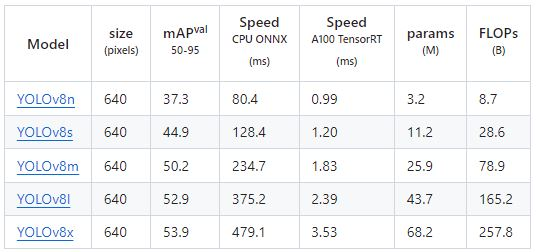

In [17]:
Image('Data-notebook/YOLOv8_models.jpg')

By comparing the validation mean average precision score across 50% to 95% confidence threshold (mAP val 50-95), our custom trained nano model (model_n_1) has a higher score of 0.53 compared to the YOLOv8n baseline score of 0.37. This proves that the custom training is working in teaching the pre-trained model to recognize the objects in our application by updating the weights of the dense layers.

However if we look into the individual classes, the mAP for vehicle_4w is only 0.34, which is lower than the baseline score. This means that there is a high amount of undetected or misclassified 4-wheeled vehicles in the validation test.

Let's explore the dataset and validation predictions to further understand the issue:

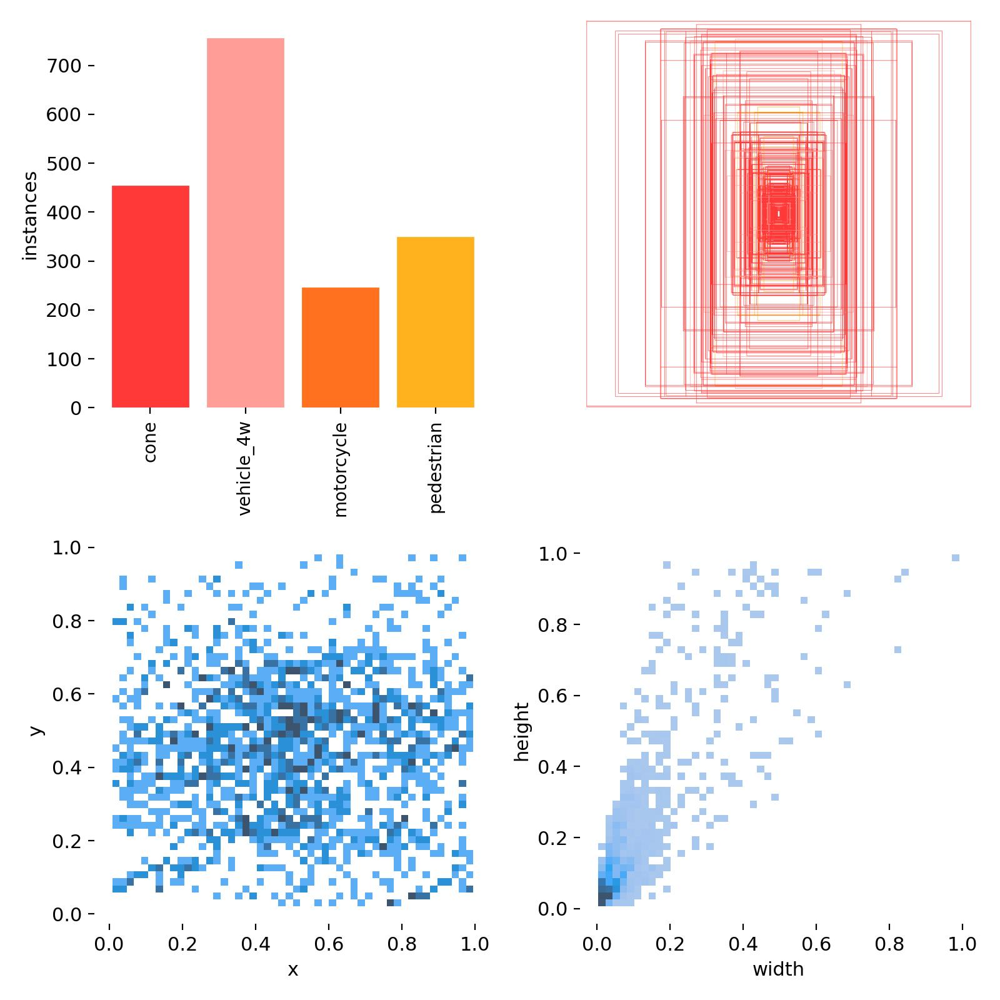

In [18]:
Image('runs/detect/train7/labels.jpg', width = 600)

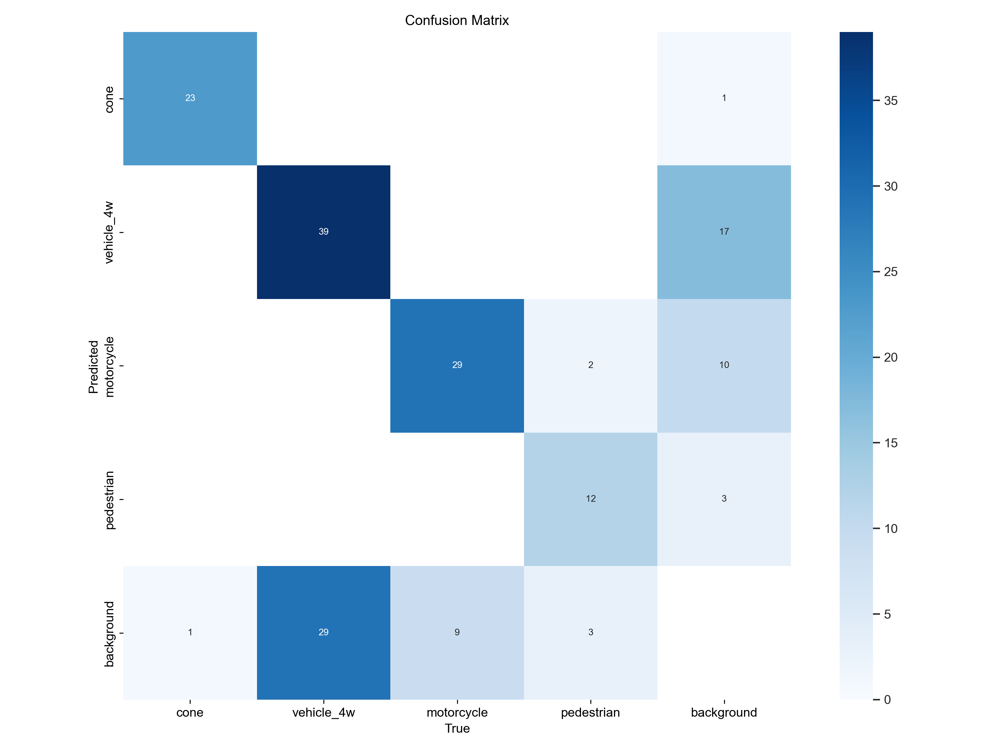

In [19]:
Image('runs/detect/val/confusion_matrix.png', width = 900)

From the bar chart, there are more than 700 instances of vehicle_4w annotations in the dataset, having way more instances compared to the other class. Even so, the mAP for this class is the lowest.

Based on the confusion matrix of predicted vs actual classes for the validation test, we understand that 42.6% of vehicles annotated as vehicle_4w in the validation dataset is undetected. Meanwhile, 30% of the vehicle_4w predictions are misclassifications.

This model will be used to predict the test set to have a deeper understanding on the issue.

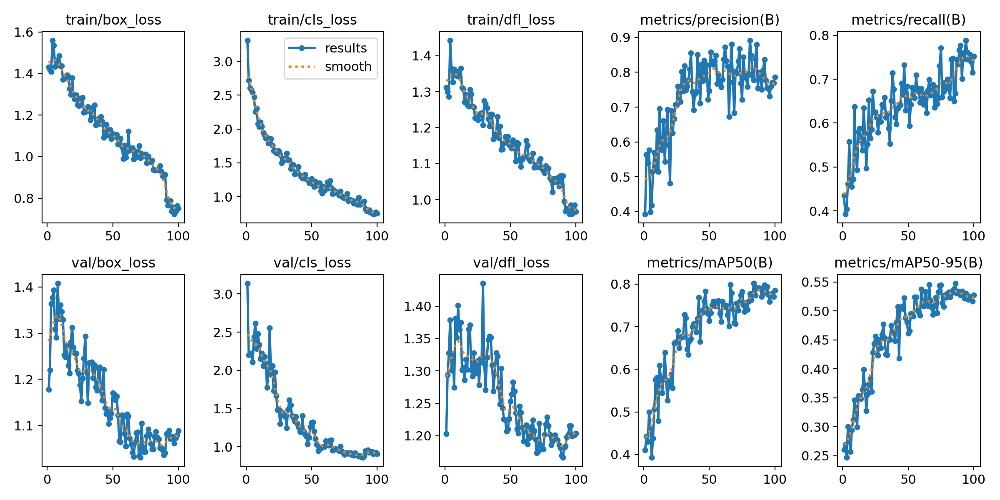

In [20]:
Image('runs/detect/train7/results.png')

From the training metric graphs, the training losses are decreasing throughout training, which shows an improving model. However the validation losses have started increasing at a certain epoch, meaning the model is starting to overfit to the training dataset after that point. Further training the model with more epochs would decrease the mAP score.

Nevertheless, the training losses have not plateaued, which shows that theoretically it can still improve. This shows that the model could be trained with additional data for more epochs to further increase the mAP score.

### Small Model:

We test the small model which has 3.5x more parameters than the nano model to ensure the better model for our dataset is used.

In [21]:
from ultralytics import YOLO

model_s = YOLO('yolov8s.pt')

  0%|          | 0.00/21.5M [00:00<?, ?B/s]

In [ ]:
model_s.train(data = 'config.yaml',
            epochs = 100,
            batch = 1,
            workers = 0,
            seed = seed
           )

In [23]:
best_small_1 = 'runs/detect/train8/weights/best.pt'
model_s_1 = YOLO(best_small_1)

In [24]:
model_s_1.val();

Ultralytics YOLOv8.1.3 🚀 Python-3.8.0 torch-1.9.1+cu111 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
Model summary (fused): 168 layers, 11127132 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning C:\Users\xiani\Desktop\Online Studies\Deep Learning Project\Malaysia Road Object Detection (YOLOv8)\data\
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<0


                   all         18        147       0.87      0.736        0.8      0.579
                  cone         18         24          1      0.983      0.995      0.873
            vehicle_4w         18         68      0.745      0.485      0.614      0.373
            motorcycle         18         38      0.833      0.711       0.77      0.544
            pedestrian         18         17      0.903      0.765      0.819      0.525
Speed: 3.4ms preprocess, 21.8ms inference, 0.0ms loss, 5.2ms postprocess per image
Results saved to runs\detect\val2


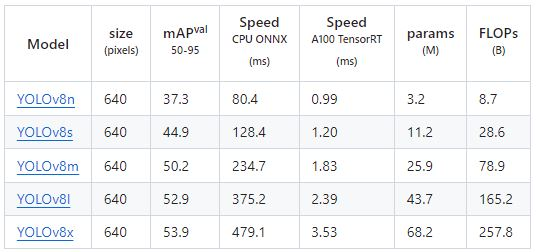

In [25]:
Image('Data-notebook/YOLOv8_models.jpg')

By comparing the mAP validation for 50-95% confidence, the custom trained model (model_s_1) has a higher score (0.58) than the YOLOv8s pre-trained model (0.45). 

It is also higher than the custom trained nano model (model_n_1) which has a score of 0.53, albeit just slightly higher. Hence, this model should perform better theoretically.

Let's explore the validation predictions:

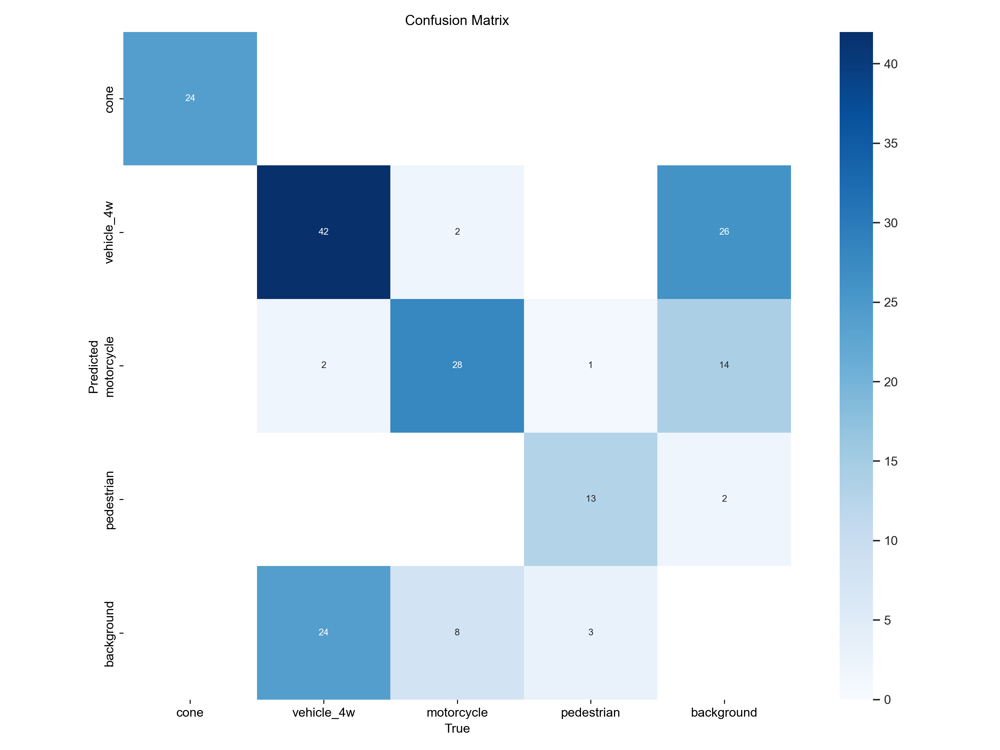

In [26]:
Image('runs/detect/val2/confusion_matrix.png', width = 900)

Similar to the nano model (model_n_1), vehicle_4w has been undetected and misclassified. However in this case there are actually 2 motorcycles which were classified as vheicle_4w compared to the perfect score of the nano model.

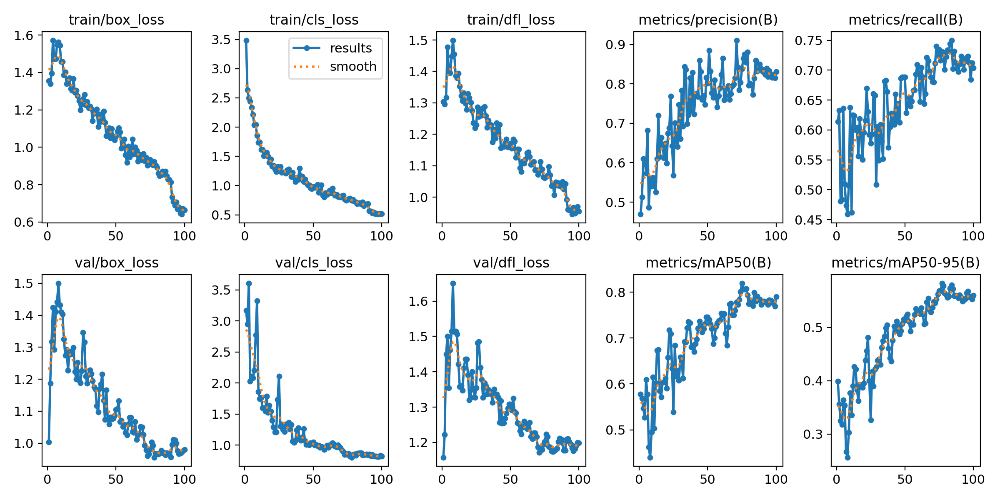

In [27]:
Image('runs/detect/train8/results.png')

The results show a similar trend to the nano model where the model has not converged but has started to overfit.

## Model Testing

By comparing the validation scores of both models, it seems like the small YOLOv8 model should perform better than the nano model. However, values on graphs do not always represent the real world detection performance. Hence, we will test the model on a few test images to further compare the models.

### Nano Model:

In [28]:
model_n_1.predict(source = 'test_images', save = True, conf = 0.3, line_width = 1);


image 1/4 C:\Users\xiani\Desktop\Online Studies\Deep Learning Project\Malaysia Road Object Detection (YOLOv8)\test_images\accident_scene.jpg: 448x640 8 cones, 4 vehicle_4ws, 1 pedestrian, 83.0ms
image 2/4 C:\Users\xiani\Desktop\Online Studies\Deep Learning Project\Malaysia Road Object Detection (YOLOv8)\test_images\highway_top_view.jpg: 448x640 14 vehicle_4ws, 10.0ms
image 3/4 C:\Users\xiani\Desktop\Online Studies\Deep Learning Project\Malaysia Road Object Detection (YOLOv8)\test_images\ho_chi_minh_intersection.jpg: 384x640 9 vehicle_4ws, 10 motorcycles, 17.0ms
image 4/4 C:\Users\xiani\Desktop\Online Studies\Deep Learning Project\Malaysia Road Object Detection (YOLOv8)\test_images\malaysia_traffic_back_view.jpeg: 448x640 54 vehicle_4ws, 5 motorcycles, 1 pedestrian, 11.0ms
Speed: 2.7ms preprocess, 30.3ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs\detect\predict


model_n_1 Predictions:


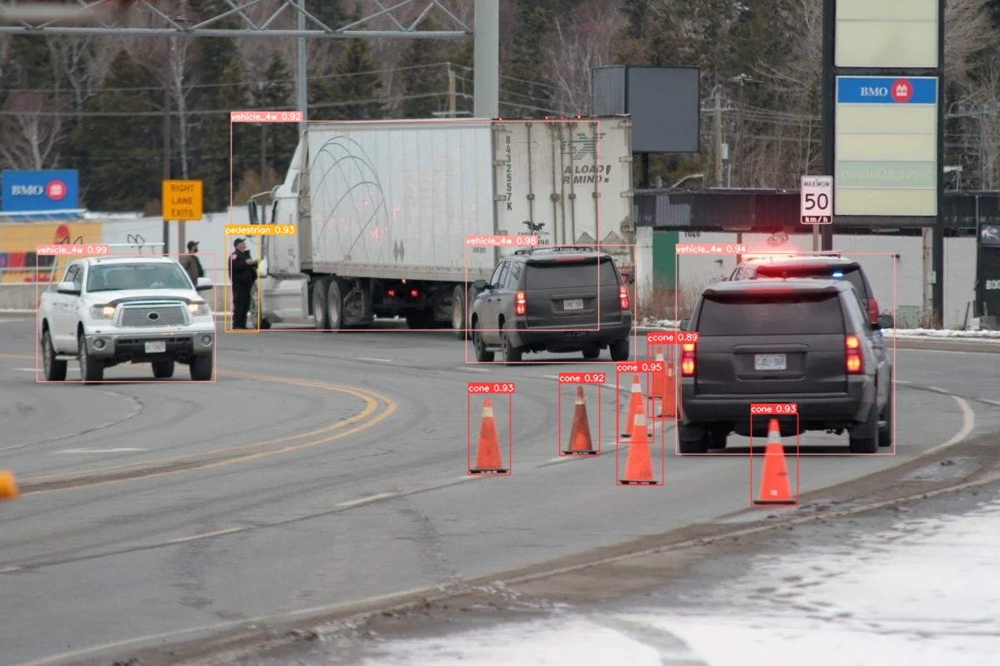

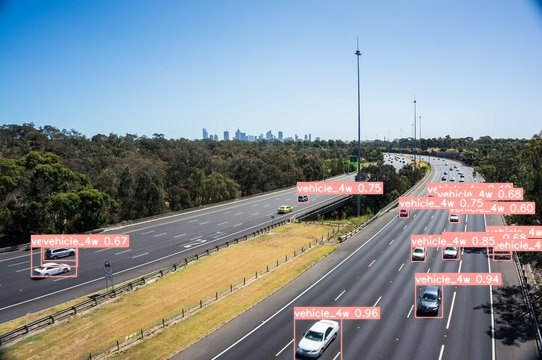

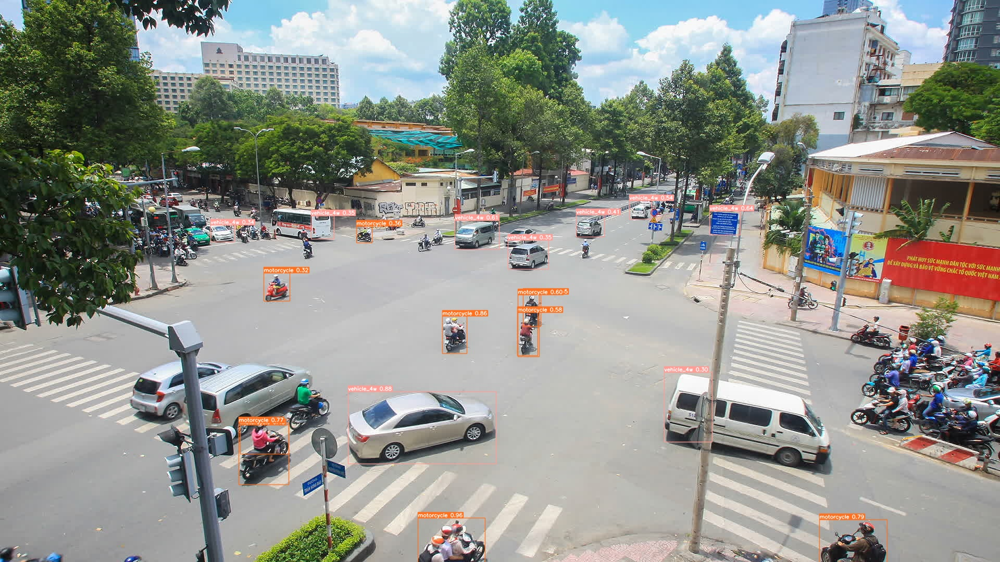

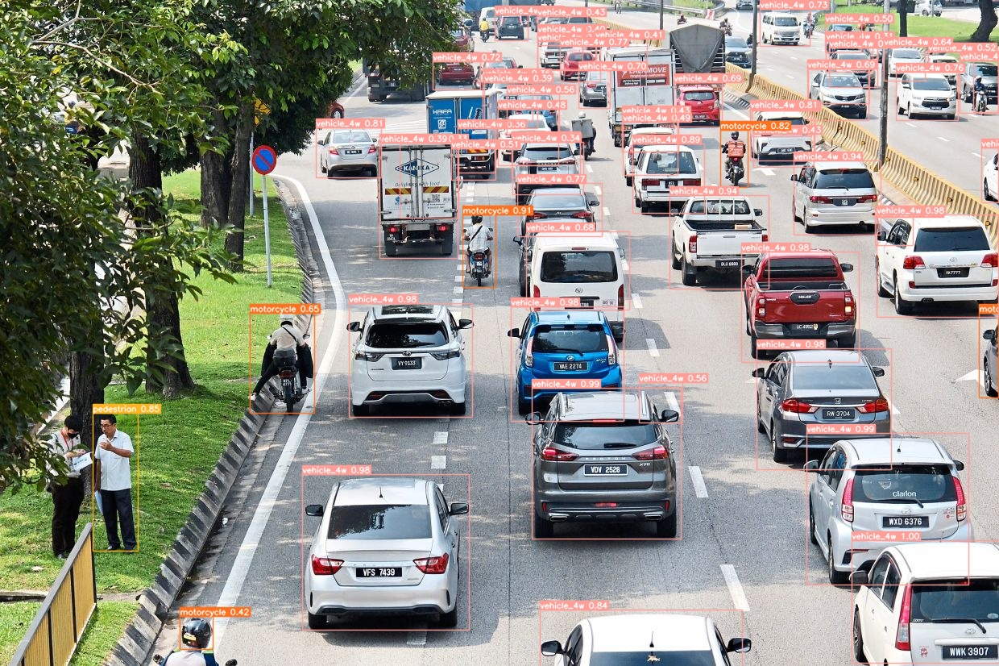

In [29]:
allowed_extensions = ['.jpg', '.jpeg', '.png']

print('model_n_1 Predictions:')

for image_path in glob.glob('runs/detect/predict/*'):
    if any(image_path.lower().endswith(ext) for ext in allowed_extensions):
        display(Image(filename = image_path, height = 600))
        print()

In [ ]:
model_n_1.predict(source = 'test_videos/kl_2015.mov', save = True, conf = 0.5, line_width = 2);

The nano model can detect the object and classify them correctly for the most part. It classifies all foud wheeled vehicles as vehicle_4w, motorcycles with riders as motorcycles, passerby on foot as pedestroan and can also detect the new class which is not included in the COCO dataset which are cones.

The test results align with the validation confusion matrix whereby the errors come from undetected classes rather than misclassified classes.

### Small Model:

In [31]:
model_s_1.predict(source = 'test_images', save = True, conf = 0.3, line_width = 1);


image 1/4 C:\Users\xiani\Desktop\Online Studies\Deep Learning Project\Malaysia Road Object Detection (YOLOv8)\test_images\accident_scene.jpg: 448x640 6 cones, 4 vehicle_4ws, 2 pedestrians, 20.9ms
image 2/4 C:\Users\xiani\Desktop\Online Studies\Deep Learning Project\Malaysia Road Object Detection (YOLOv8)\test_images\highway_top_view.jpg: 448x640 10 vehicle_4ws, 1 motorcycle, 14.0ms
image 3/4 C:\Users\xiani\Desktop\Online Studies\Deep Learning Project\Malaysia Road Object Detection (YOLOv8)\test_images\ho_chi_minh_intersection.jpg: 384x640 13 vehicle_4ws, 12 motorcycles, 20.8ms
image 4/4 C:\Users\xiani\Desktop\Online Studies\Deep Learning Project\Malaysia Road Object Detection (YOLOv8)\test_images\malaysia_traffic_back_view.jpeg: 448x640 34 vehicle_4ws, 4 motorcycles, 1 pedestrian, 14.0ms
Speed: 1.8ms preprocess, 17.4ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs\detect\predict3


model_s_1 Predictions:


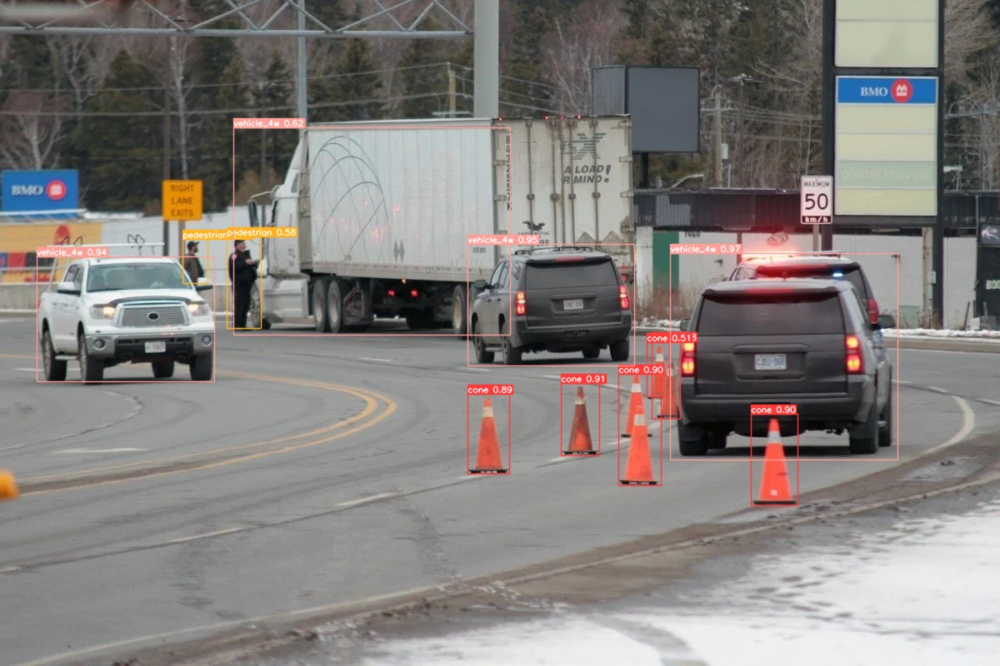

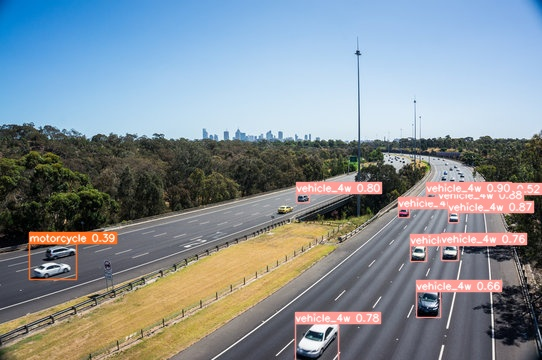

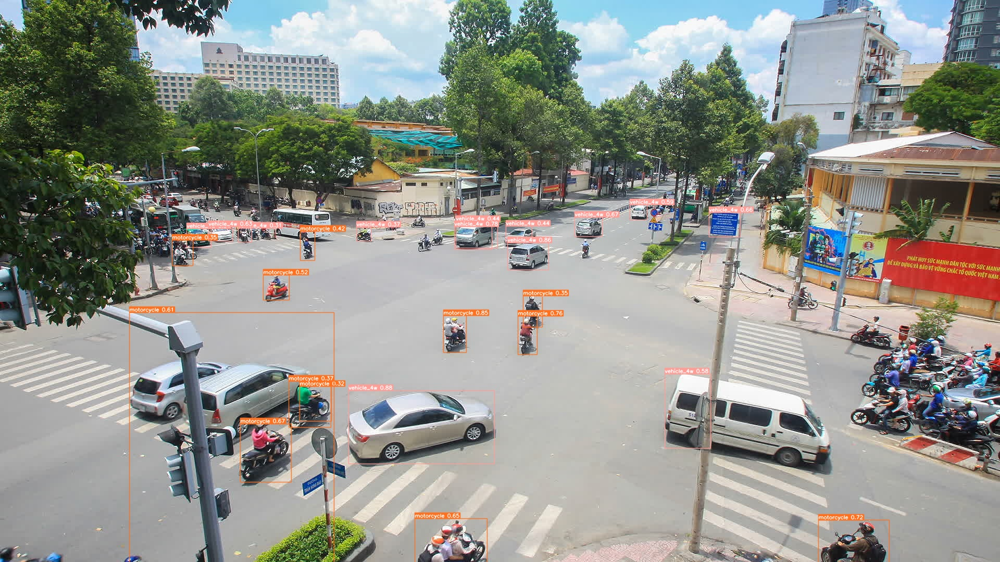

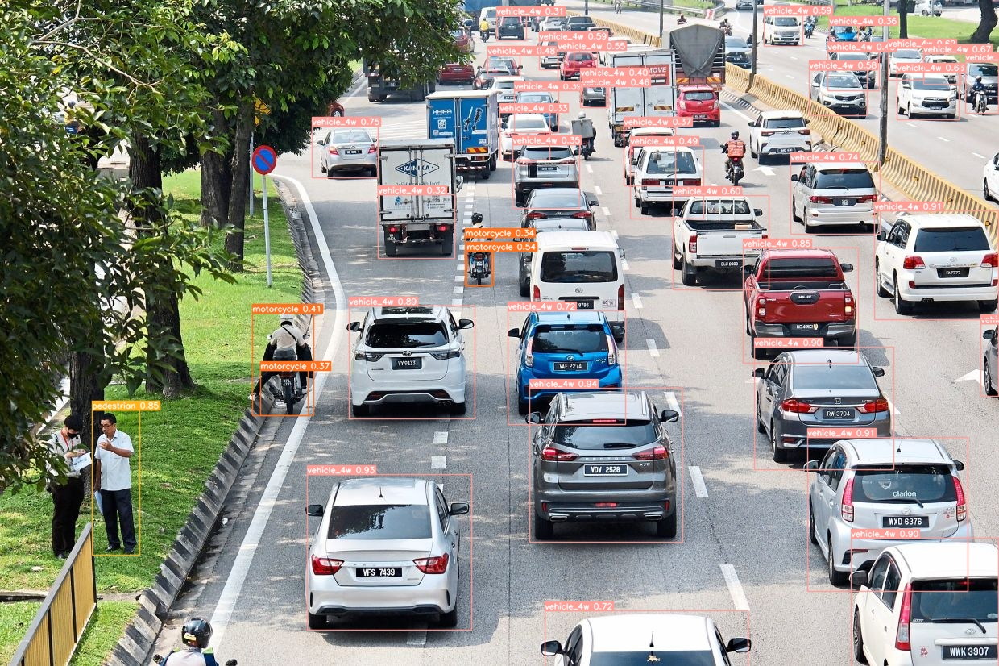

In [32]:
allowed_extensions = ['.jpg', '.jpeg', '.png']

print('model_s_1 Predictions:')

for image_path in glob.glob('runs/detect/predict3/*'):
    if any(image_path.lower().endswith(ext) for ext in allowed_extensions):
        display(Image(filename = image_path, height = 600))
        print()

In [ ]:
model_s_1.predict(source = 'test_videos/kl_2015.mov', save = True, conf = 0.5, line_width = 1, classes = [1, 2, 3]);

The small model has more errors in detecting and classifying the object. By comparing the predictions, it looks like the nano model performs better than the small model. It detects and classifies the objects more accurately.

Looking back at the train/validation/test datasets, the training and validation datasets come from the same source, where we download the images in batches using certain keywords from Google Images. The dataset is then split randomly between training and validation set. Meanwhile, the test set is obtained by individually searching for images using distinct keywords. Hence, while the training and validation images share similar features, they differ from those in the test set.

The **small YOLO model might be overfitting** to the training set during training, leading to better performance on the validation set, while compromising its ability to generalize to unseen data. The **nano YOLO model on the other hand might generalize better to new data**, resulting in better performance on the testing set.

### Pre-Trained Model

We will compare the custom nano model to the pre-trained YOLOv8n nano model (baseline):

In [34]:
pretrained_YOLO_nano = YOLO('yolov8n.pt')

In [35]:
pretrained_YOLO_nano.predict(source = 'test_images', save = True, conf = 0.3, line_width = 1);


image 1/4 C:\Users\xiani\Desktop\Online Studies\Deep Learning Project\Malaysia Road Object Detection (YOLOv8)\test_images\accident_scene.jpg: 448x640 2 persons, 2 cars, 3 trucks, 83.0ms
image 2/4 C:\Users\xiani\Desktop\Online Studies\Deep Learning Project\Malaysia Road Object Detection (YOLOv8)\test_images\highway_top_view.jpg: 448x640 9 cars, 11.0ms
image 3/4 C:\Users\xiani\Desktop\Online Studies\Deep Learning Project\Malaysia Road Object Detection (YOLOv8)\test_images\ho_chi_minh_intersection.jpg: 384x640 2 persons, 9 cars, 3 motorcycles, 1 truck, 14.0ms
image 4/4 C:\Users\xiani\Desktop\Online Studies\Deep Learning Project\Malaysia Road Object Detection (YOLOv8)\test_images\malaysia_traffic_back_view.jpeg: 448x640 5 persons, 20 cars, 1 motorcycle, 1 bus, 10 trucks, 12.0ms
Speed: 2.5ms preprocess, 30.0ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs\detect\predict5


pretrained_YOLO_nano Predictions:


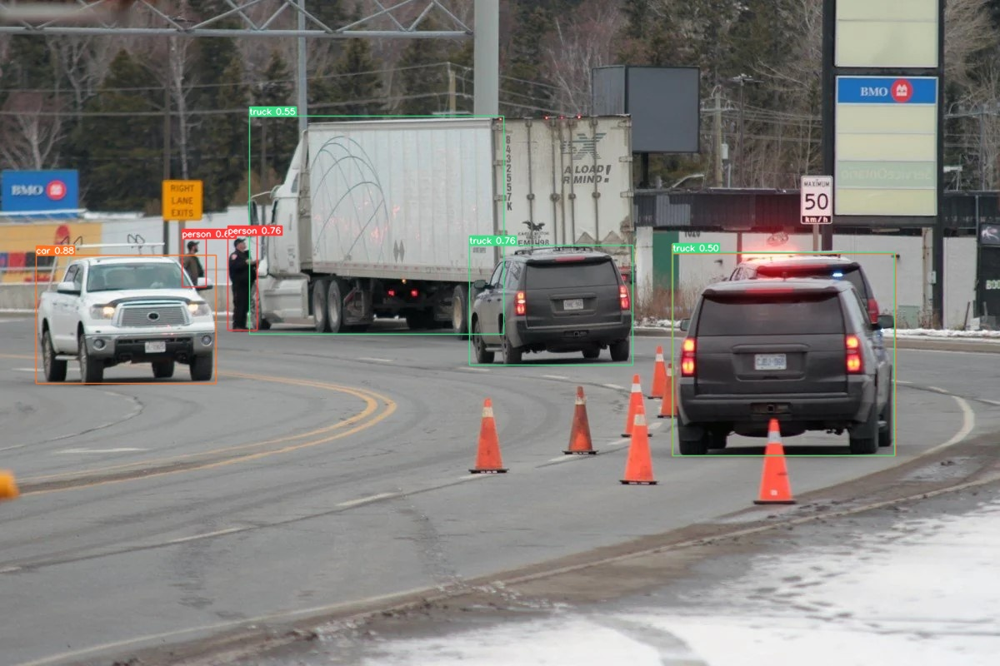

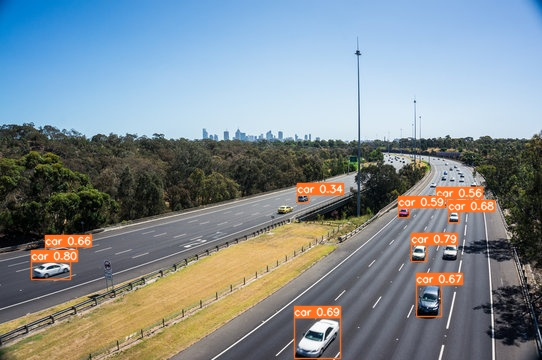

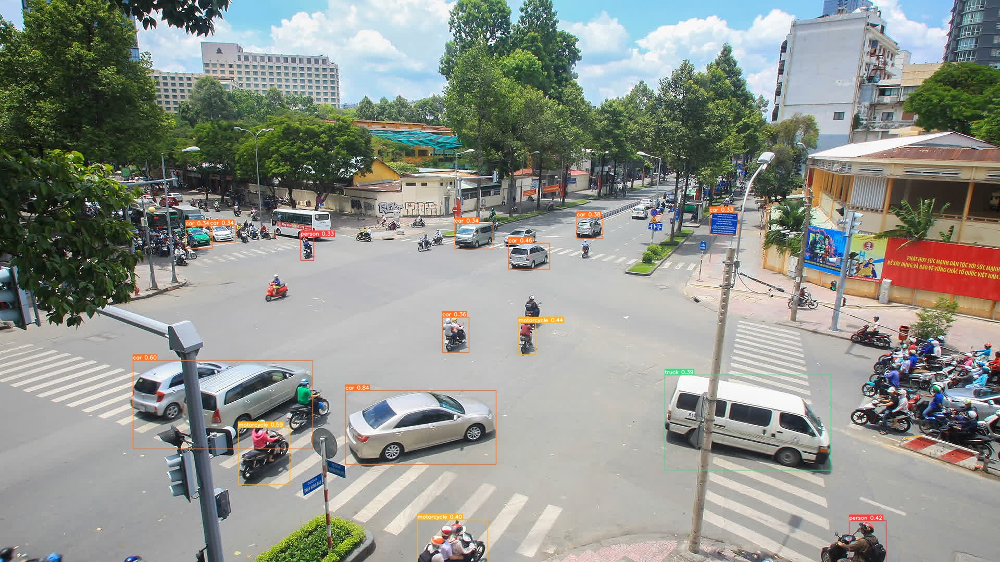

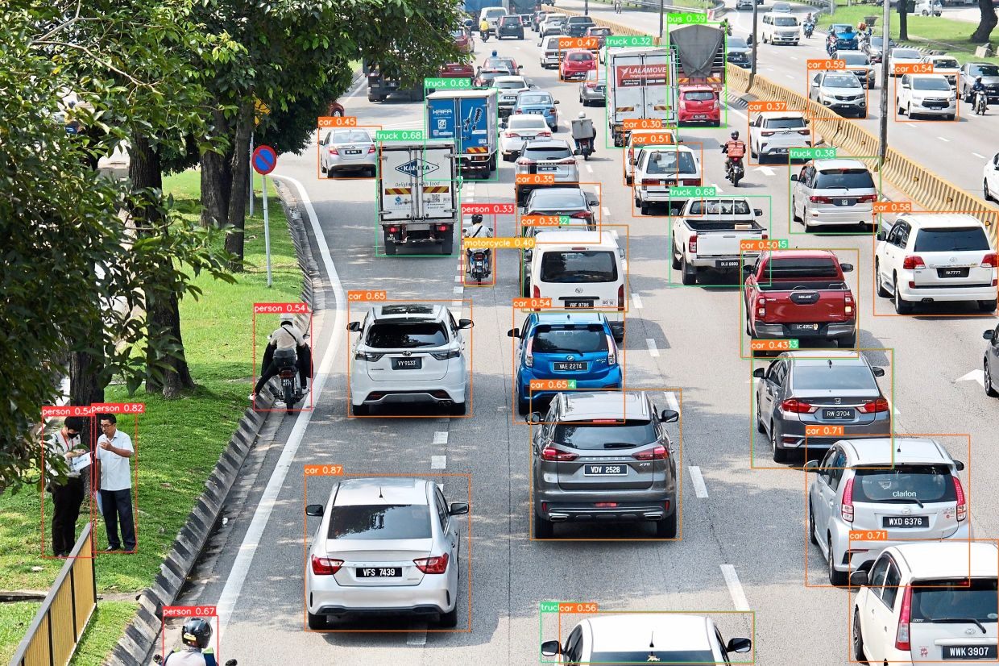

In [36]:
allowed_extensions = ['.jpg', '.jpeg', '.png']

print('pretrained_YOLO_nano Predictions:')

for image_path in glob.glob('runs/detect/predict5/*'):
    if any(image_path.lower().endswith(ext) for ext in allowed_extensions):
        display(Image(filename = image_path, height = 600))
        print()

As expected, the model predicts the classes according to the object categories available in the COCO dataset.

Compared to the custom trained nano model, the pre-trained YOLOv8n model has way more misclassifications than expected. This shows the result of training on images featuring objects from difference countries than where it needs to be applied to could hinder its ability to generalize effectively. For example, a motorcycle from the United States could have a completely different shape to a motorcycle from Asia.

To conclude, the nano YOLOv8 model is the most suitably sized model for our dataset and the custom trained nano model is an improvement from the pre-trained nano model.

### Actual Application Test Comparison

In [ ]:
test_video = 'test_videos/irl_ground_vert_1.mov'

pretrained_YOLO_nano.predict(source = test_video, save = True, conf = 0.70, line_width = 2);

In [ ]:
test_video = 'test_videos/irl_ground_vert_1.mov'

model_n_1.predict(source = test_video, save = True, conf = 0.70, line_width = 2);

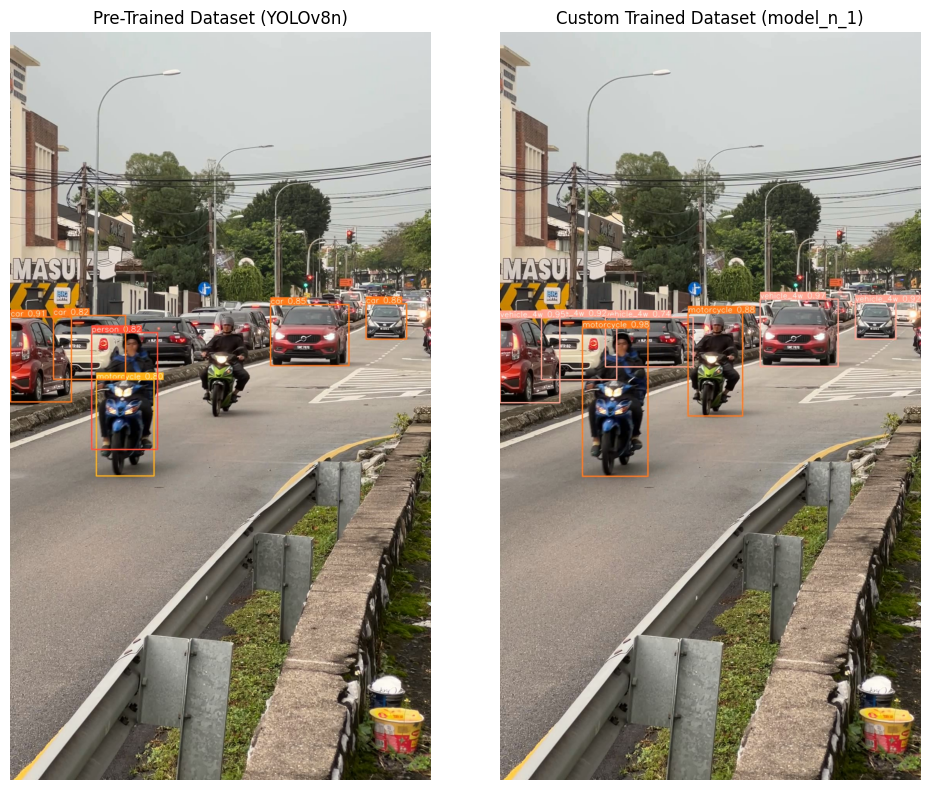

In [39]:
titles = ['Pre-Trained Dataset (YOLOv8n)', 'Custom Trained Dataset (model_n_1)']

pretrained_image_path = 'runs/detect/predict6/irl_ground_vert_1 - frame.jpg'
custom_image_path = 'runs/detect/predict7/irl_ground_vert_1 - frame.jpg'

plt.figure(figsize = (10, 8))

for i, path in enumerate([pretrained_image_path, custom_image_path]):
    plt.subplot(1, 2, i + 1)
    img = cv2.imread(path)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(titles[i])
    plt.axis("off")

plt.tight_layout()
plt.show();

The pre-trained model has many undetected objects.

The custom trained model has almost perfect detections and classifications.

### Test pre-trained trained YOLO models (baseline) (IRL vid)

In [ ]:
test_video = 'test_videos/irl_top_hori_1.mov'

pretrained_YOLO_nano.predict(source = test_video, save = True, conf = 0.5, line_width = 2);

In [ ]:
test_video = 'test_videos/irl_top_hori_1.mov'

model_n_1.predict(source = test_video, save = True, conf = 0.5, line_width = 2);

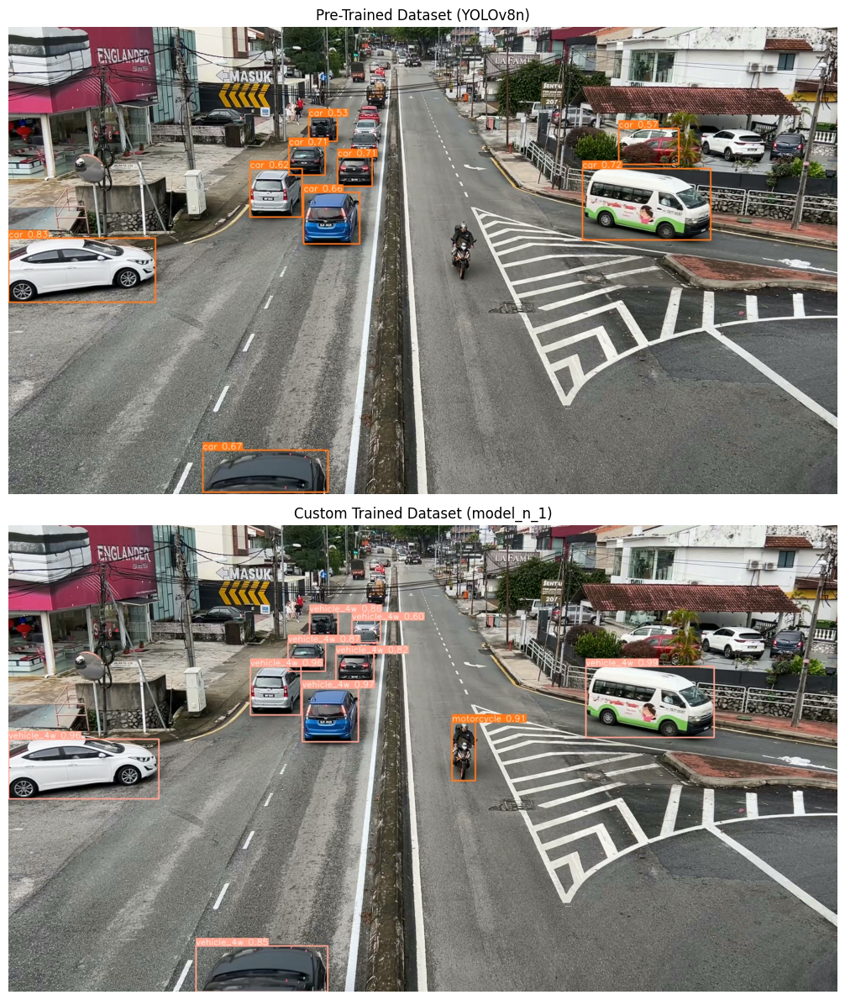

In [42]:
titles = ['Pre-Trained Dataset (YOLOv8n)', 'Custom Trained Dataset (model_n_1)']

pretrained_image_path = 'runs/detect/predict6/irl_top_hori_1 - frame.jpg'
custom_image_path = 'runs/detect/predict7/irl_top_hori_1 - frame.jpg'

plt.figure(figsize = (14, 12))

for i, path in enumerate([pretrained_image_path, custom_image_path]):
    plt.subplot(2, 1, i + 1)
    img = cv2.imread(path)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(titles[i])
    plt.axis("off")

plt.tight_layout()
plt.show();

The pre-trained model has many undetected objects.

The custom trained model has almost perfect detections and classifications.

The video predictions are available in the Data-notebook folder.